# Regional regression

In [2]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

import numpy as np
import pandas as pd
import xarray as xr
import esem
from utils import *
import cartopy.crs as ccrs
import cartopy.feature as cfeature

from sklearn import metrics


import warnings
warnings.filterwarnings('ignore')

In [7]:
train_files = ["ssp126", "ssp370", "ssp585", "historical"]
y_train = create_predictdand_data(train_file

In [8]:
Y.compute()

<xarray.Dataset>
Dimensions:  (lat: 192, lon: 288, year: 423)
Coordinates:
  * lat      (lat) float64 -90.0 -89.06 -88.12 -87.17 ... 87.17 88.12 89.06 90.0
  * lon      (lon) float64 0.0 1.25 2.5 3.75 5.0 ... 355.0 356.2 357.5 358.8
  * year     (year) int64 1850 1851 1852 1853 1854 ... 2096 2097 2098 2099 2100
Data variables:
    tas      (year, lat, lon) float32 -0.1424 -0.1424 -0.1424 ... 11.68 11.68
    pr       (year, lat, lon) float32 0.000513 0.000513 ... 0.3538 0.3538
    huss     (year, lat, lon) float32 -1.108e-06 -1.108e-06 ... 0.001122
    hurs     (year, lat, lon) float32 0.09258 0.09261 0.09261 ... -8.373 -8.373
    rlds     (year, lat, lon) float32 0.9069 0.9063 0.9063 ... 57.51 57.51 57.51
    rsds     (year, lat, lon) float32 -1.53 -1.529 -1.529 ... -27.29 -27.29
    sfcWind  (year, lat, lon) float32 -0.03228 -0.03229 -0.03229 ... 1.168 1.168
    ps       (year, lat, lon) float32 -117.7 -117.7 -117.7 ... -330.5 -330.5
    mrsos    (year, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
    evspsbl  (year, lat, lon) float32 -6.049e-10 -6.192e-10 ... 3.421e-06

In [9]:
X = xr.concat([xr.open_dataset('data_path/inputs_historical.nc'),xr.open_dataset('data_path/inputs_ssp126.nc'),xr.open_dataset('data_path/inputs_ssp370.nc'),xr.open_dataset('data_path/inputs_ssp585.nc')], dim='time')

In [10]:
X["time"]=np.arange(1,424) 

In [11]:
X

<xarray.Dataset>
Dimensions:    (time: 423, longitude: 144, latitude: 96)
Coordinates:
  * time       (time) int64 1 2 3 4 5 6 7 8 ... 416 417 418 419 420 421 422 423
  * longitude  (longitude) float64 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * latitude   (latitude) float64 -90.0 -88.11 -86.21 ... 86.21 88.11 90.0
Data variables:
    CO2        (time) float64 0.1883 0.3772 0.5738 ... 9.235e+03 9.363e+03
    SO2        (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 2.08e-13
    CH4        (time) float64 0.03131 0.03174 0.03218 ... 0.4715 0.4684 0.4653
    BC         (time, latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 8.343e-15

In [12]:
def get_regional_df(da):
    # Roll the longitude to -180 to 180
    da = da.assign_coords(longitude=(((da.longitude + 180) % 360) - 180))
    da = da.roll(longitude=int(len(da['longitude']) / 2), roll_coords=True)

    # Get the average from four main emission regions
    north_america = da.sel(latitude=slice(25, 60), longitude=slice(-130, -60)).mean(['latitude', 'longitude']).assign_coords({'region': "NA"})
    europe = da.sel(latitude=slice(30, 75), longitude=slice(-10, 40)).mean(['latitude', 'longitude']).assign_coords({'region': "EU"})
    south_asia = da.sel(latitude=slice(5, 30), longitude=slice(65, 100)).mean(['latitude', 'longitude']).assign_coords({'region': "SA"})
    east_asia = da.sel(latitude=slice(20, 50), longitude=slice(100, 145)).mean(['latitude', 'longitude']).assign_coords({'region': "EA"})

    # Stack them back together
    ds = xr.concat([north_america, europe, south_asia, east_asia], dim='region') 
    df = ds.to_dataframe()[['SO2', 'BC']].unstack('region') # Get rid of the other variables and unstack the region dimension
    df.columns = df.columns.map(lambda x: '_'.join([str(i) for i in x])) # Flatten the multiindex
    return df * 1000*100 * 60*60*24*365 * 1e-12 * 510.1 * 1e6# kg -> Gt

In [13]:
# Bring the emissions data back together again and normalise
leading_historical_inputs = X[['CO2', 'CH4']].to_dataframe()

# Combine with aerosol EOFs
leading_historical_inputs=pd.concat([leading_historical_inputs, get_regional_df(X)], axis=1)

In [14]:
leading_historical_inputs

,CO2,CH4,SO2_NA,SO2_EU,SO2_SA,SO2_EA,BC_NA,BC_EU,BC_SA,BC_EA
time,,,,,,,,,,
1,0.188297,0.031306,0.000546,0.005329,0.000287,0.000242,0.000169,0.000673,0.000846,0.001036
2,0.377244,0.031742,0.000663,0.005234,0.000289,0.000241,0.000176,0.000678,0.000850,0.001029
3,0.573814,0.032178,0.000717,0.005360,0.000291,0.000241,0.000182,0.000695,0.000855,0.001022
4,0.778848,0.032614,0.000799,0.005455,0.000293,0.000240,0.000189,0.000712,0.000860,0.001015
5,1.020320,0.033049,0.000877,0.006273,0.000296,0.000239,0.000195,0.000774,0.000866,0.001008
...,...,...,...,...,...,...,...,...,...,...
419,8849.364057,0.477741,0.004896,0.012144,0.019095,0.018574,0.000255,0.000512,0.000832,0.001755
420,8978.159279,0.474618,0.004848,0.011931,0.017539,0.018223,0.000249,0.000497,0.000786,0.001700
421,9106.629265,0.471496,0.004800,0.011717,0.015984,0.017871,0.000244,0.000481,0.000740,0.001646


In [15]:
X_test = xr.open_dataset('/glade/u/home/ianderson/inputs/inputs_ssp245.nc').compute()
Y_test = xr.open_dataset('/glade/u/home/ianderson/train_test/y_test_outputs.nc').compute()

In [17]:
test_inputs = X_test[['CO2', 'CH4']].to_dataframe()

# Combine with aerosol regional data
test_inputs = pd.concat([test_inputs, get_regional_df(X_test)], axis=1)

In [18]:
y_train_tas = Y['tas'].values.reshape(-1, 192 * 288)
tas_truth = Y_test['tas']

y_train_pr = Y['pr'].values.reshape(-1, 192 * 288)
pr_truth = Y_test['pr']

y_train_huss = Y['huss'].values.reshape(-1, 192 * 288)
huss_truth = Y_test['huss']

y_train_hurs = Y['hurs'].values.reshape(-1, 192 * 288)
hurs_truth = Y_test['hurs']

y_train_rlds = Y['rlds'].values.reshape(-1, 192 * 288)
rlds_truth = Y_test['rlds']

y_train_rsds = Y['rsds'].values.reshape(-1, 192 * 288)
rsds_truth = Y_test['rsds']

y_train_wind = Y['sfcWind'].values.reshape(-1, 192 * 288)
wind_truth = Y_test['sfcWind']

y_train_ps = Y['ps'].values.reshape(-1, 192 * 288)
ps_truth = Y_test['ps']

# filling ocean grid points with 0 for now
y_train_mrsos = Y['mrsos'].fillna(0.).values.reshape(-1, 192 * 288)
mrsos_truth = Y_test['mrsos']

y_train_evspsbl = Y['evspsbl'].values.reshape(-1, 192 * 288)
evspsbl_truth = Y_test['evspsbl']

# Regression models - by variable

### `tas` - surface air temp 

In [19]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge

In [20]:
# Linear regression
l1 = LinearRegression()
lr_tas = l1.fit(leading_historical_inputs, y_train_tas)

In [21]:
l_tas = lr_tas.predict(test_inputs)
l_out_tas = l_tas.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(tas_truth[35], l_out_tas[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(tas_truth[85], l_out_tas[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(tas_truth[30:41], l_out_tas[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(tas_truth[75:], l_out_tas[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(tas_truth[35:], l_out_tas[35:]).mean()}")

RMSE at 2050: 0.37594529660206943
RMSE at 2100: 1.4340286457346347
RMSE 2045-2055: 0.4338746909111567
RMSE 2090-2100: 1.4132045566694782
RMSE 2050-2100: 1.0823888249323068


In [89]:
# Ridge regression
r1 = Ridge(alpha = 1.0)
r_tas=r1.fit(leading_historical_inputs, y_train_tas)

r_tas = r_tas.predict(test_inputs)
r_out_tas = r_tas.reshape(86, 192, 288)


# print(f"RMSE: {get_rmse(ps_truth[35:], m_out_ps[35:]).mean()}")

print(f"RMSE at 2050: {get_rmse(tas_truth[35], r_out_tas[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(tas_truth[85], r_out_tas[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(tas_truth[30:41], r_out_tas[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(tas_truth[75:], r_out_tas[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(tas_truth[35:], r_out_tas[35:]).mean()}")

RMSE at 2050: 0.3626696946542684
RMSE at 2100: 0.45975079716535044
RMSE 2045-2055: 0.4280769586788335
RMSE 2090-2100: 0.4263041267320432
RMSE 2050-2100: 0.43365039918990933


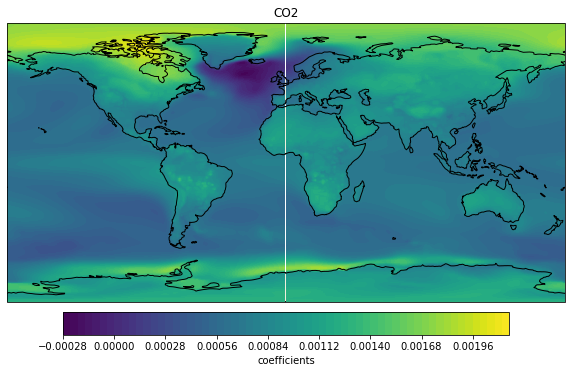

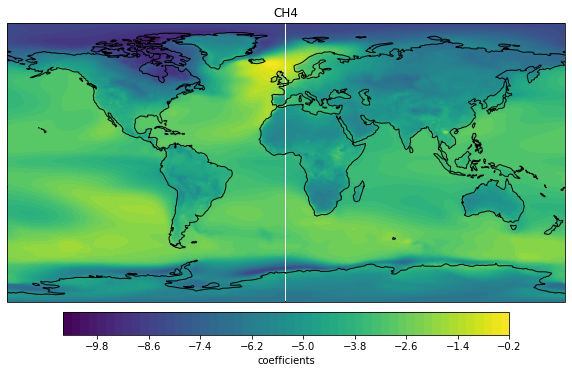

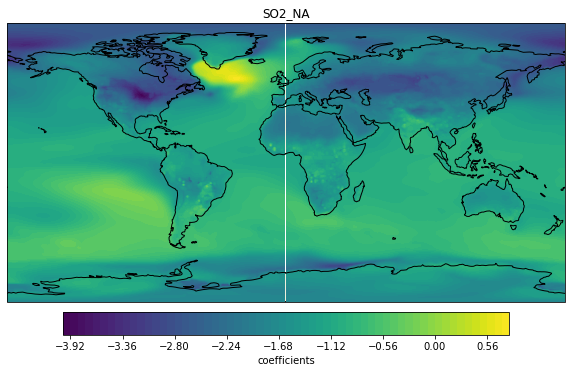

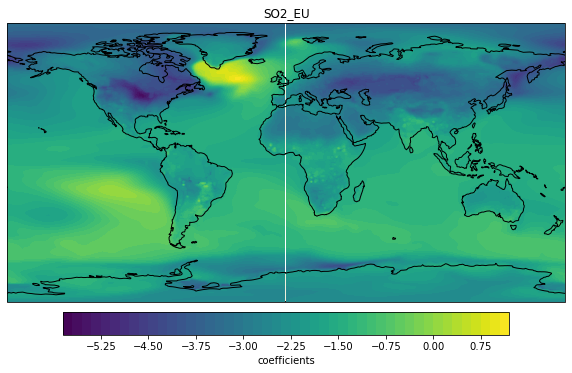

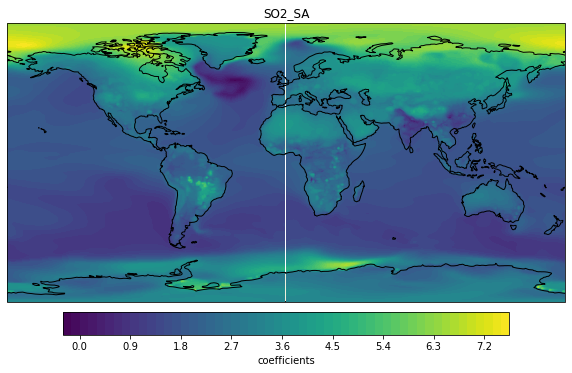

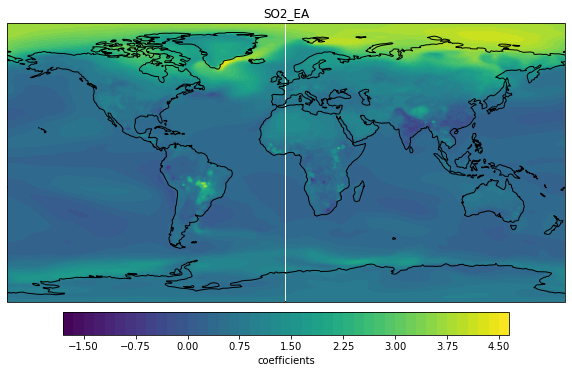

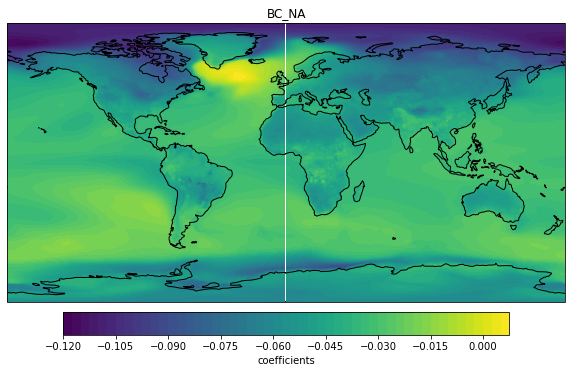

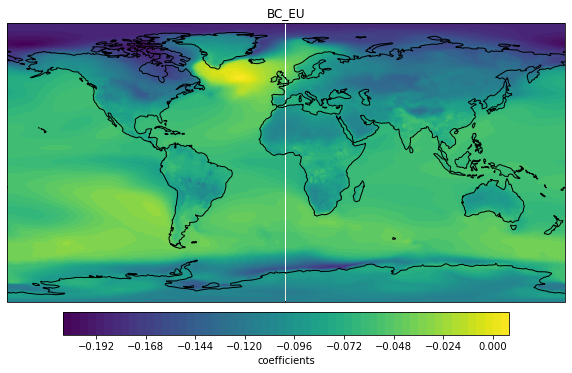

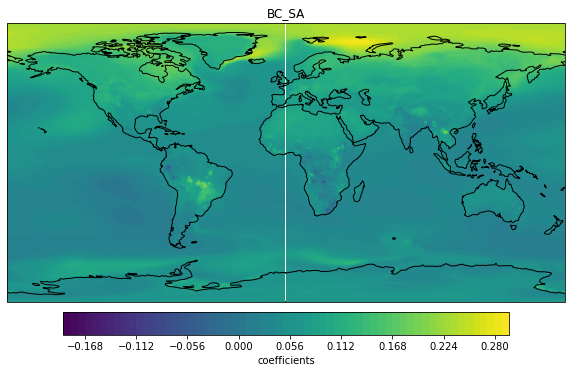

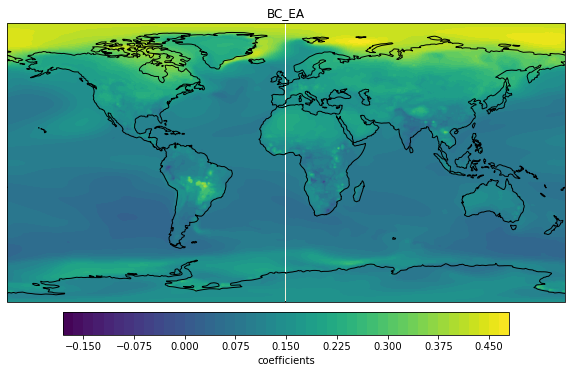

In [90]:
# coeficients
tas_coef = r1.coef_
tas_coef1 = tas_coef.reshape(192, 288, 10)

lat_vals = Y['lat']
lon_vals = Y['lon']
feature_names=['CO2', 'CH4', 'SO2_NA', 'SO2_EU', 'SO2_SA', 'SO2_EA', 'BC_NA', 'BC_EU', 'BC_SA', 'BC_EA']
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, tas_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()
    
    

### `pr` - precipitation

In [24]:
# Linear
l2 = LinearRegression()
lr_pr = l2.fit(leading_historical_inputs, y_train_pr)

l_pr = lr_pr.predict(test_inputs)
l_out_pr = l_pr.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(pr_truth[35], l_out_pr[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(pr_truth[85], l_out_pr[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(pr_truth[30:41], l_out_pr[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(pr_truth[75:], l_out_pr[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(pr_truth[35:], l_out_pr[35:]).mean()}")

RMSE at 2050: 0.41616017795686333
RMSE at 2100: 0.5413143243952228
RMSE 2045-2055: 0.5277878504516005
RMSE 2090-2100: 0.5962594862951042
RMSE 2050-2100: 0.5862612113898605


In [25]:
# Ridge
r2 = Ridge(alpha = 1.0)
ridge_pr=r2.fit(leading_historical_inputs, y_train_pr)

r_pr = ridge_pr.predict(test_inputs)
r_out_pr = r_pr.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(pr_truth[35], r_out_pr[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(pr_truth[85], r_out_pr[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(pr_truth[30:41], r_out_pr[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(pr_truth[75:], r_out_pr[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(pr_truth[35:], r_out_pr[35:]).mean()}")

RMSE at 2050: 0.40346891239259985
RMSE at 2100: 0.5307532684934044
RMSE 2045-2055: 0.5070507602644029
RMSE 2090-2100: 0.5673198331204424
RMSE 2050-2100: 0.5665931158444903


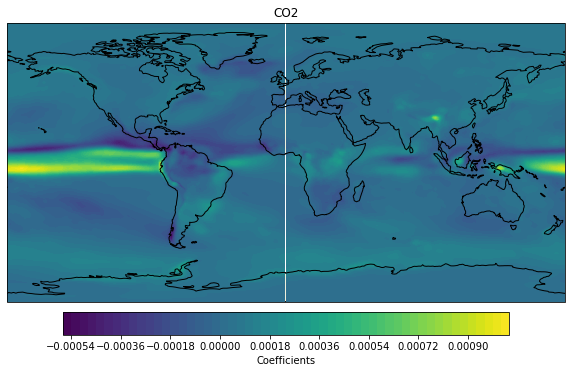

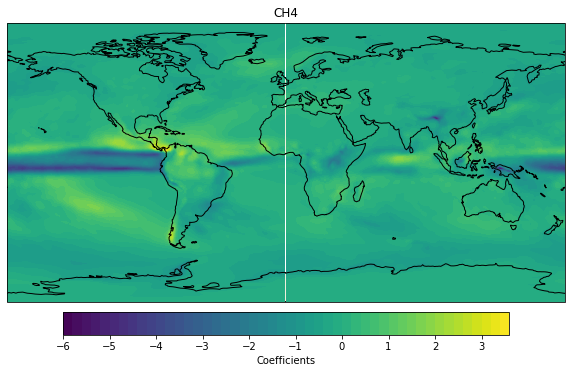

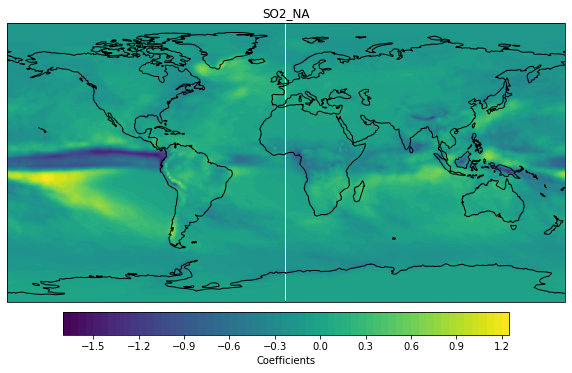

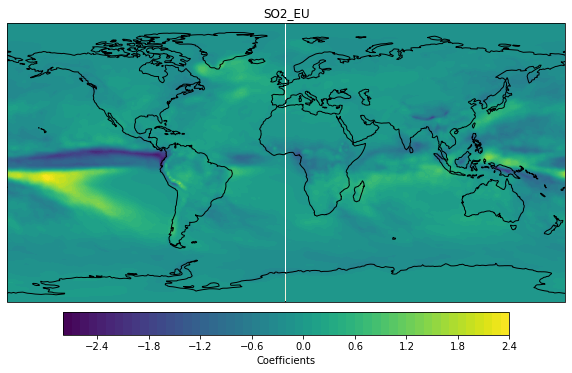

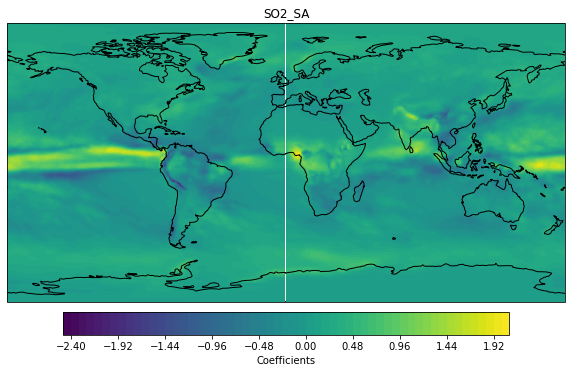

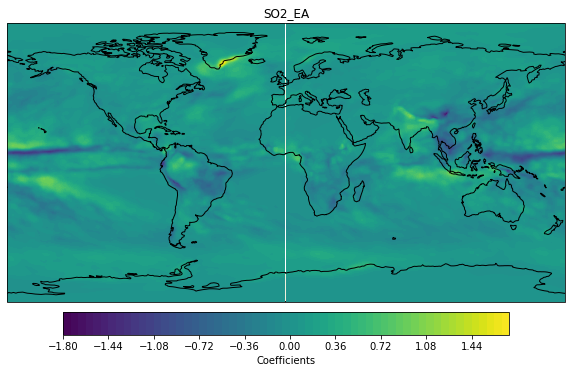

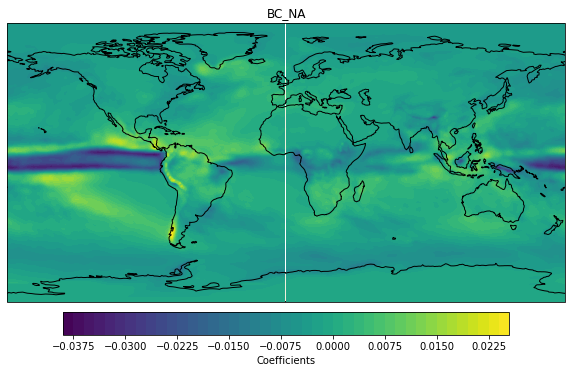

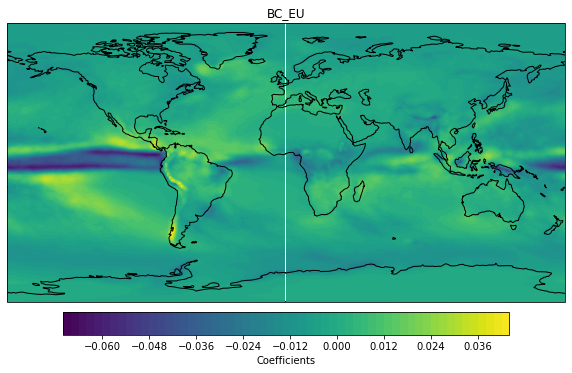

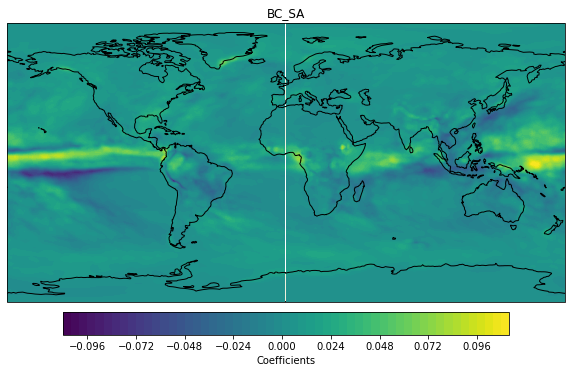

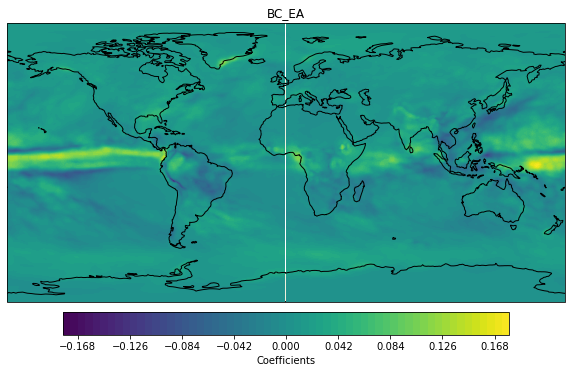

In [26]:
# coeficients
pr_coef = r2.coef_
pr_coef1 = pr_coef.reshape(192, 288, 10)

lat_vals = Y['lat']
lon_vals = Y['lon']
feature_names=['CO2', 'CH4', 'SO2_NA', 'SO2_EU', 'SO2_SA', 'SO2_EA', 'BC_NA', 'BC_EU', 'BC_SA', 'BC_EA']
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, pr_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='Coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()
    

### `huss`

In [27]:
# Linear
l3 = LinearRegression()
lr_huss = l3.fit(leading_historical_inputs, y_train_huss)

l_huss = lr_huss.predict(test_inputs)
l_out_huss = l_huss.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(huss_truth[35], l_out_huss[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(huss_truth[85], l_out_huss[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(huss_truth[30:41], l_out_huss[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(huss_truth[75:], l_out_huss[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(huss_truth[35:], l_out_huss[35:]).mean()}")

RMSE at 2050: 0.0002359056371666356
RMSE at 2100: 0.0009955989569544472
RMSE 2045-2055: 0.00027050710335773835
RMSE 2090-2100: 0.000992155758269653
RMSE 2050-2100: 0.0007289617356857337


In [91]:
# Ridge
r3 = Ridge(alpha = 3.0)
ridge_huss=r3.fit(leading_historical_inputs, y_train_huss)

r_huss = ridge_huss.predict(test_inputs)
r_out_huss = r_huss.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(huss_truth[35], r_out_huss[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(huss_truth[85], r_out_huss[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(huss_truth[30:41], r_out_huss[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(huss_truth[75:], r_out_huss[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(huss_truth[35:], r_out_huss[35:]).mean()}")

RMSE at 2050: 0.0002031913593598437
RMSE at 2100: 0.0002550400778738952
RMSE 2045-2055: 0.00025714502102287487
RMSE 2090-2100: 0.00027497121144229666
RMSE 2050-2100: 0.0002800989602220811


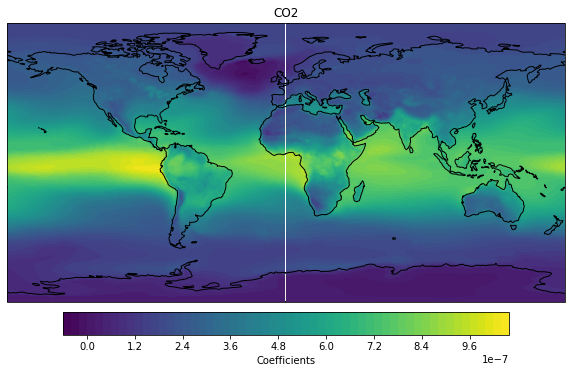

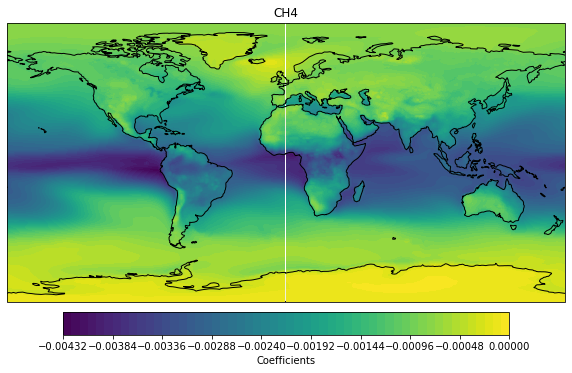

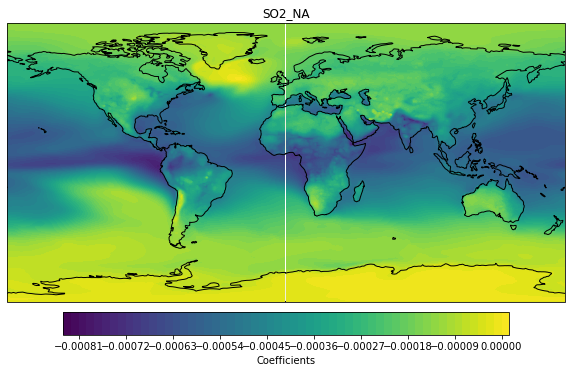

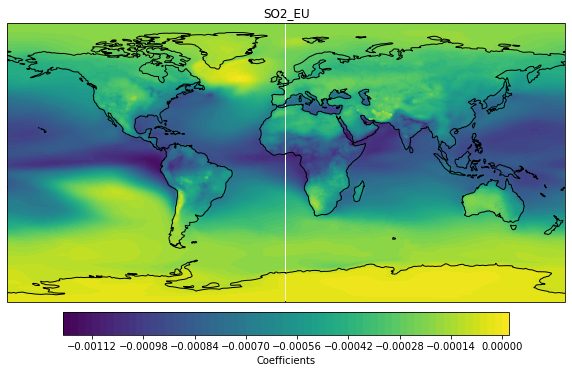

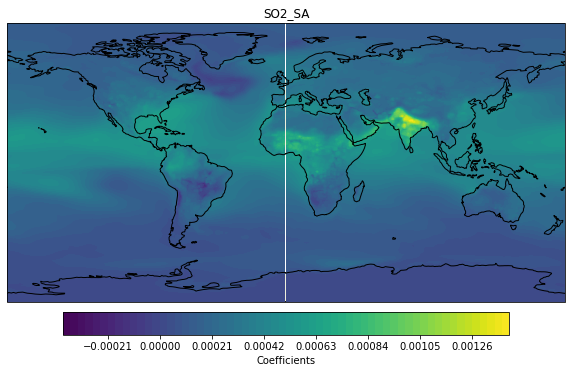

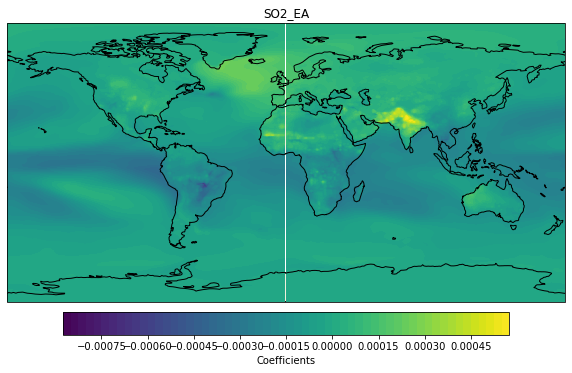

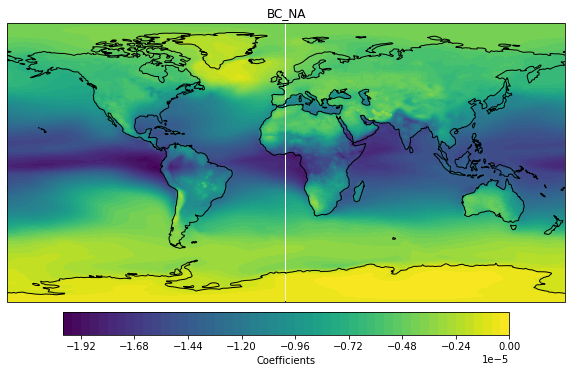

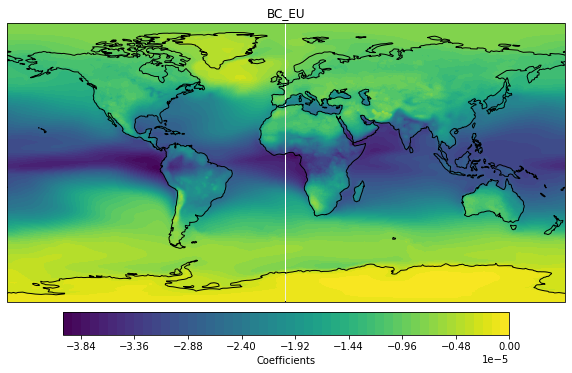

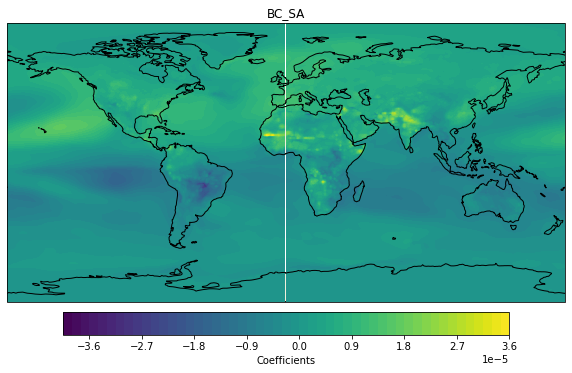

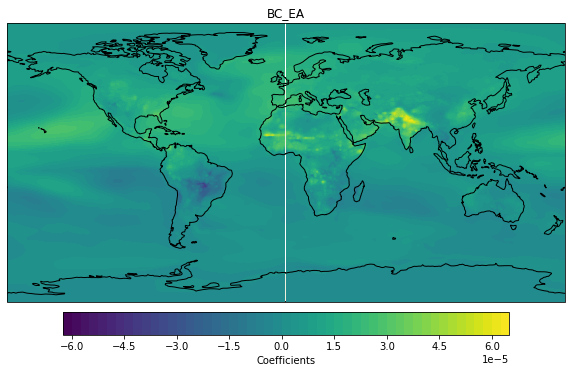

In [92]:
# coefficients
huss_coef = r3.coef_
huss_coef1 = huss_coef.reshape(192, 288, 10)

lat_vals = Y['lat']
lon_vals = Y['lon']
feature_names=['CO2', 'CH4', 'SO2_NA', 'SO2_EU', 'SO2_SA', 'SO2_EA', 'BC_NA', 'BC_EU', 'BC_SA', 'BC_EA']
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, huss_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='Coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()
    

### `hurs`

In [32]:
# Linear
l4 = LinearRegression()
lr_hurs = l4.fit(leading_historical_inputs, y_train_hurs)

l_hurs = lr_hurs.predict(test_inputs)
l_out_hurs = l_hurs.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(hurs_truth[35], l_out_hurs[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(hurs_truth[85], l_out_hurs[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(hurs_truth[30:41], l_out_hurs[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(hurs_truth[75:], l_out_hurs[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(hurs_truth[35:], l_out_hurs[35:]).mean()}")

RMSE at 2050: 0.9124976433912165
RMSE at 2100: 1.4658228719833795
RMSE 2045-2055: 1.0122974007666519
RMSE 2090-2100: 1.4677130893788044
RMSE 2050-2100: 1.250724168426771


In [33]:
# Ridge
r4 = Ridge(alpha = 0.5)
ridge_hurs=r4.fit(leading_historical_inputs, y_train_hurs)

r_hurs = ridge_hurs.predict(test_inputs)
r_out_hurs = r_hurs.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(hurs_truth[35], r_out_hurs[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(hurs_truth[85], r_out_hurs[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(hurs_truth[30:41], r_out_hurs[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(hurs_truth[75:], r_out_hurs[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(hurs_truth[35:], r_out_hurs[35:]).mean()}")

RMSE at 2050: 0.7904539772079116
RMSE at 2100: 0.8968589525699117
RMSE 2045-2055: 0.9323734835490882
RMSE 2090-2100: 0.9853178710335495
RMSE 2050-2100: 0.9786338091078338


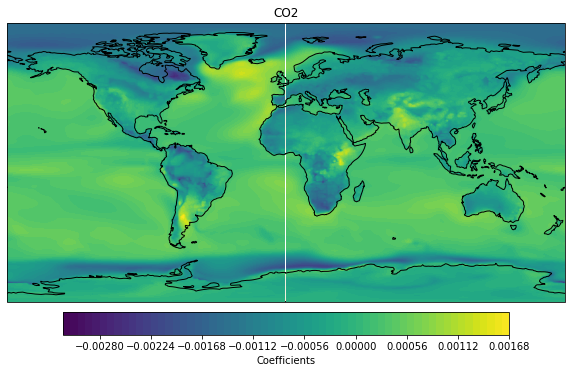

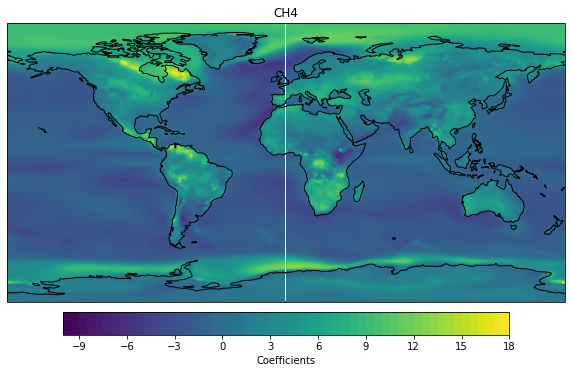

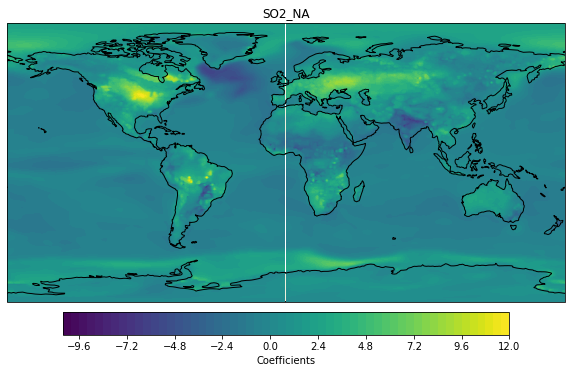

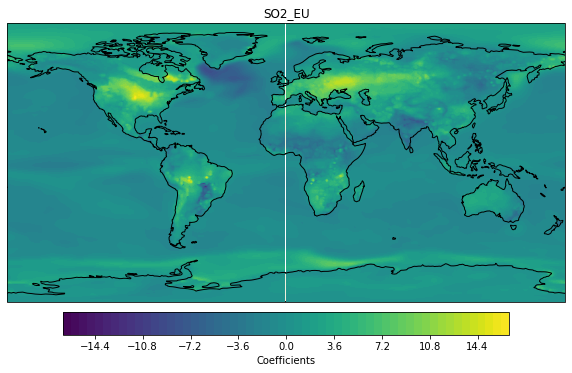

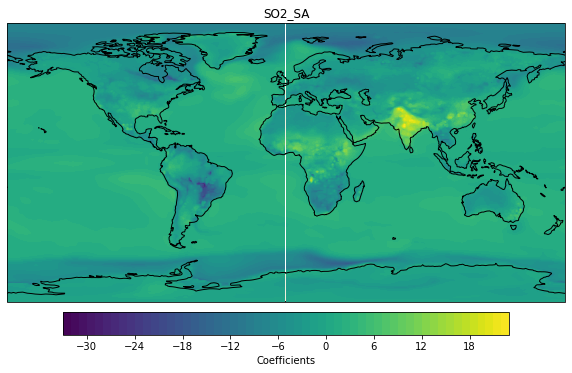

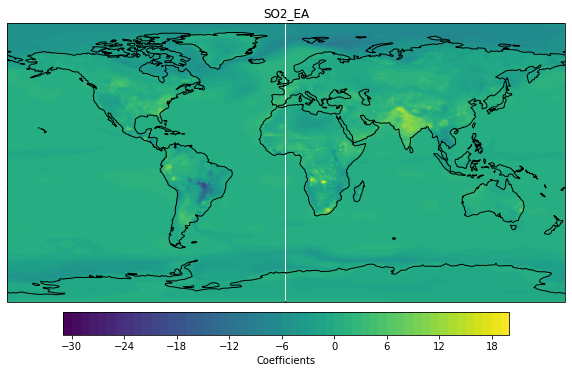

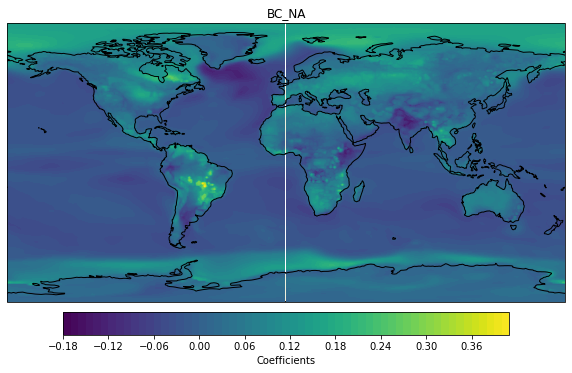

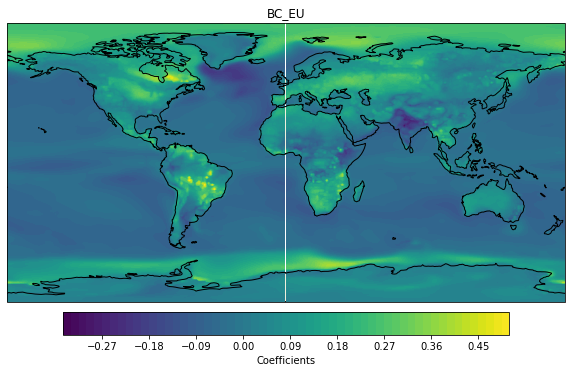

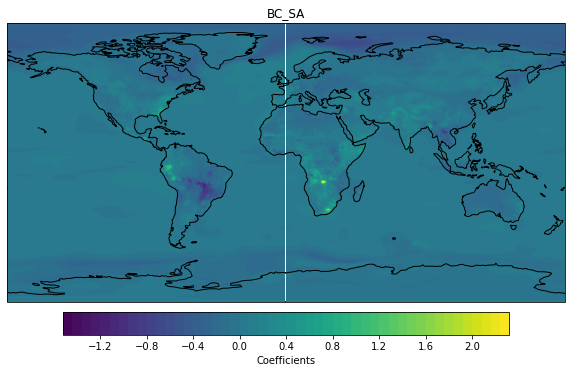

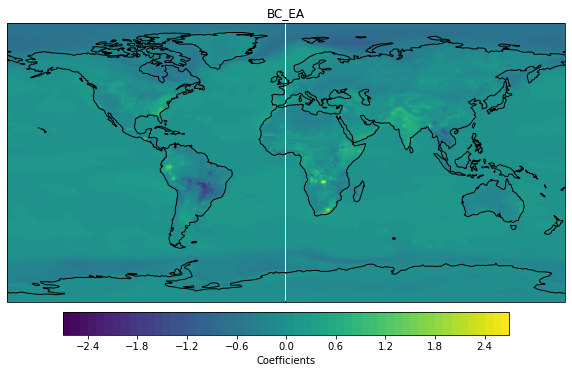

In [34]:
# Coefficients
hurs_coef = r4.coef_
hurs_coef1 = hurs_coef.reshape(192, 288, 10)

lat_vals = Y['lat']
lon_vals = Y['lon']
feature_names=['CO2', 'CH4', 'SO2_NA', 'SO2_EU', 'SO2_SA', 'SO2_EA', 'BC_NA', 'BC_EU', 'BC_SA', 'BC_EA']
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, hurs_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='Coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()
    

### `rlds`

In [38]:
# Linear
l5 = LinearRegression()
lr_rlds = l5.fit(leading_historical_inputs, y_train_rlds)

l_rlds = lr_rlds.predict(test_inputs)
l_out_rlds = l_rlds.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(rlds_truth[35], l_out_rlds[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(rlds_truth[85], l_out_rlds[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(rlds_truth[30:41], l_out_rlds[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(rlds_truth[75:], l_out_rlds[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(rlds_truth[35:], l_out_rlds[35:]).mean()}")

RMSE at 2050: 2.176356294445007
RMSE at 2100: 10.952251147785114
RMSE 2045-2055: 2.6449516183553134
RMSE 2090-2100: 10.8387894150671
RMSE 2050-2100: 7.752227254039499


In [39]:
# Ridge
r5 = Ridge(alpha = 3.0)
ridge_rlds=r5.fit(leading_historical_inputs, y_train_rlds)

r_rlds = ridge_rlds.predict(test_inputs)
r_out_rlds = r_rlds.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(rlds_truth[35], r_out_rlds[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(rlds_truth[85], r_out_rlds[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(rlds_truth[30:41], r_out_rlds[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(rlds_truth[75:], r_out_rlds[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(rlds_truth[35:], r_out_rlds[35:]).mean()}")

RMSE at 2050: 2.3138511953101952
RMSE at 2100: 2.5647112137085926
RMSE 2045-2055: 2.758847487672772
RMSE 2090-2100: 2.629526455688215
RMSE 2050-2100: 2.6486409498437085


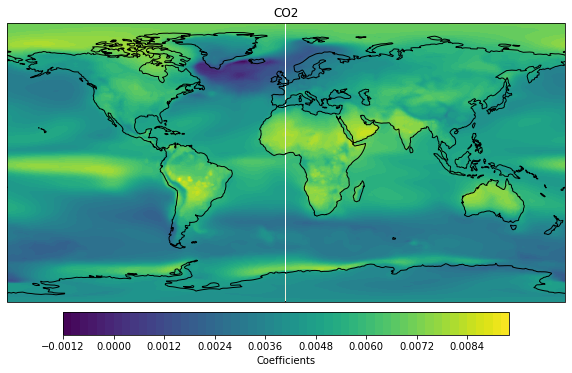

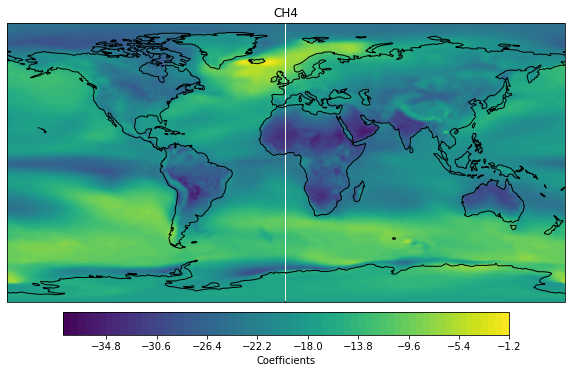

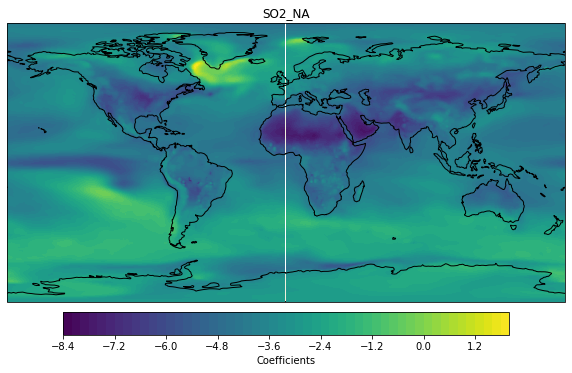

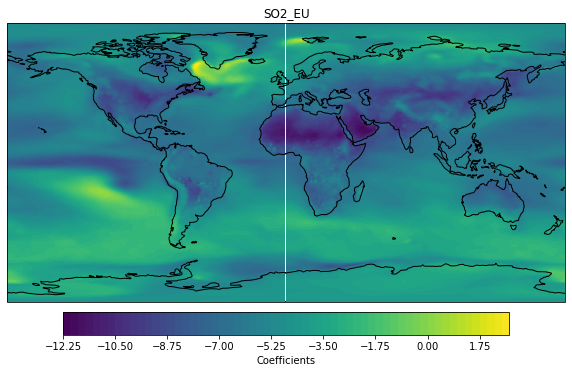

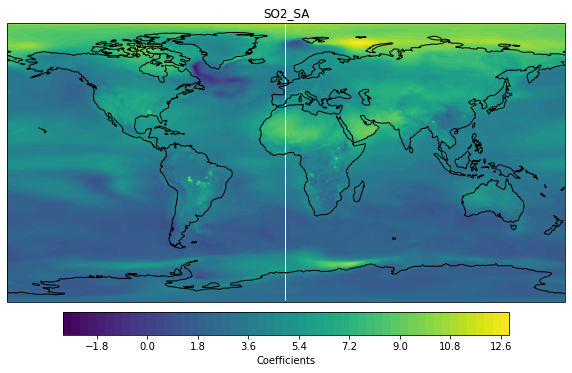

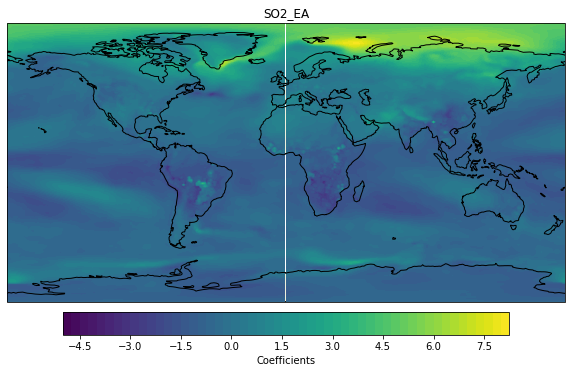

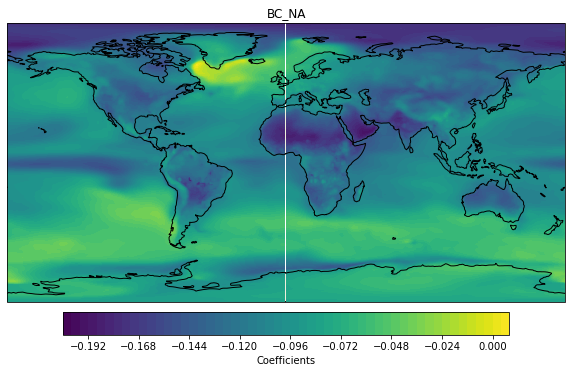

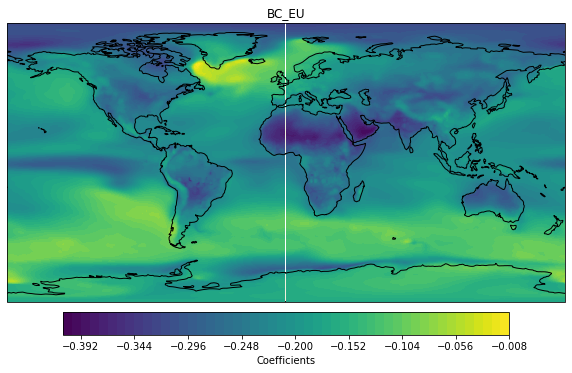

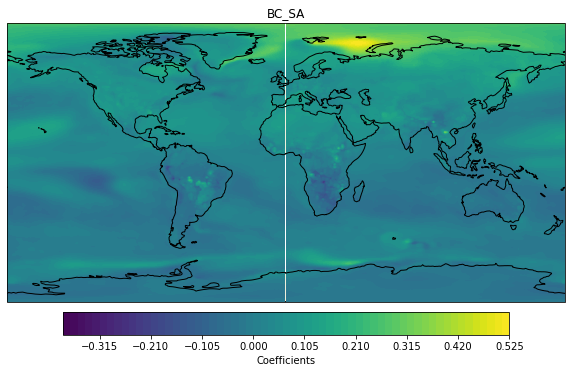

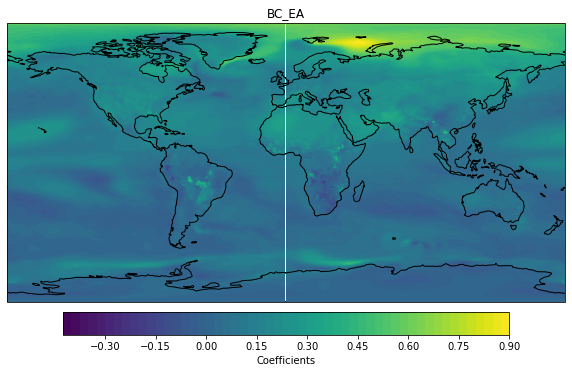

In [49]:
# Coefficients
rlds_coef = r5.coef_
rlds_coef1 = rlds_coef.reshape(192, 288, 10)

lat_vals = Y['lat']
lon_vals = Y['lon']
feature_names=['CO2', 'CH4', 'SO2_NA', 'SO2_EU', 'SO2_SA', 'SO2_EA', 'BC_NA', 'BC_EU', 'BC_SA', 'BC_EA']
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, rlds_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='Coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()
    

### `rsds`

In [41]:
# Linear
l6 = LinearRegression()
lr_rsds = l6.fit(leading_historical_inputs, y_train_rsds)

l_rsds = lr_rsds.predict(test_inputs)
l_out_rsds = l_rsds.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(rsds_truth[35], l_out_rsds[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(rsds_truth[85], l_out_rsds[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(rsds_truth[30:41], l_out_rsds[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(rsds_truth[75:], l_out_rsds[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(rsds_truth[35:], l_out_rsds[35:]).mean()}")

RMSE at 2050: 4.393749174012475
RMSE at 2100: 8.00107805015737
RMSE 2045-2055: 4.738565035161377
RMSE 2090-2100: 7.819474141257491
RMSE 2050-2100: 6.091312517642034


In [46]:
# Ridge
r6 = Ridge(alpha = 1.0)
ridge_rsds = r6.fit(leading_historical_inputs, y_train_rsds)

r_rsds = ridge_rsds.predict(test_inputs)
r_out_rsds = r_rsds.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(rsds_truth[35], r_out_rsds[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(rsds_truth[85], r_out_rsds[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(rsds_truth[30:41], r_out_rsds[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(rsds_truth[75:], r_out_rsds[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(rsds_truth[35:], r_out_rsds[35:]).mean()}")

RMSE at 2050: 3.6416059333736746
RMSE at 2100: 4.541656778092409
RMSE 2045-2055: 4.28450223090935
RMSE 2090-2100: 4.711205945354451
RMSE 2050-2100: 4.535743073716376


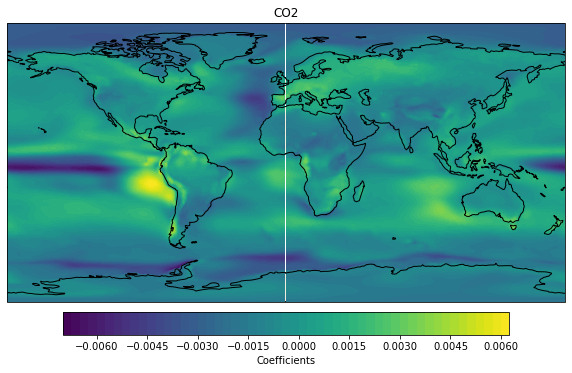

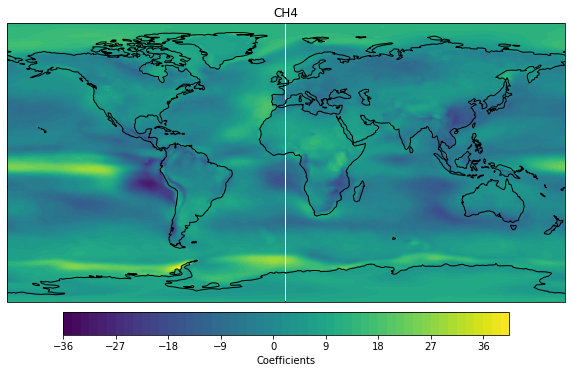

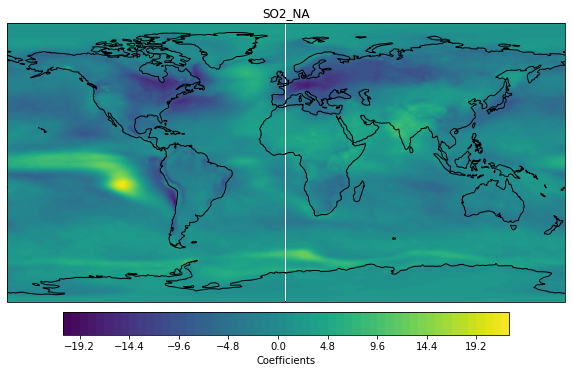

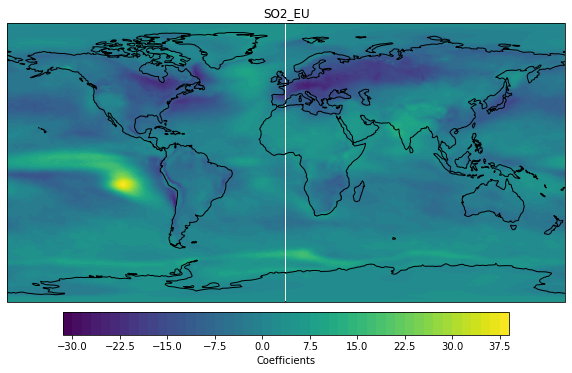

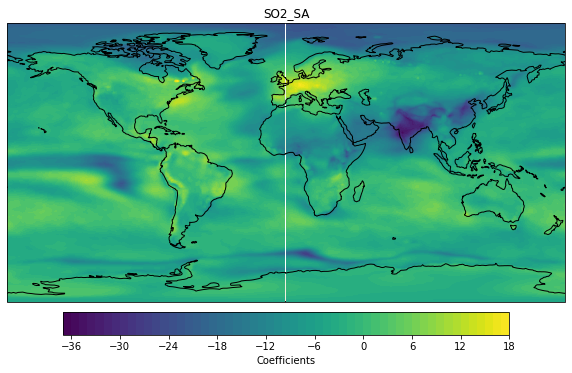

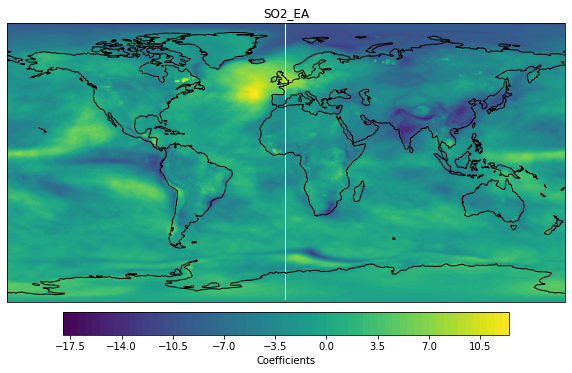

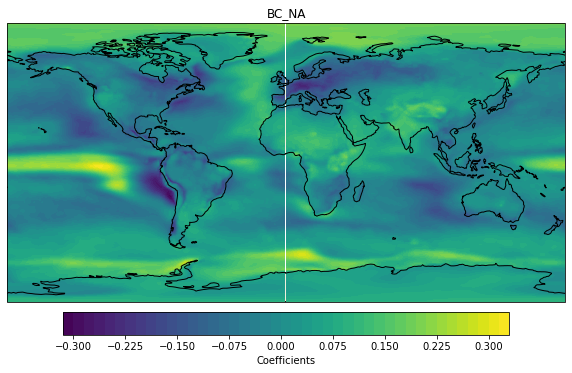

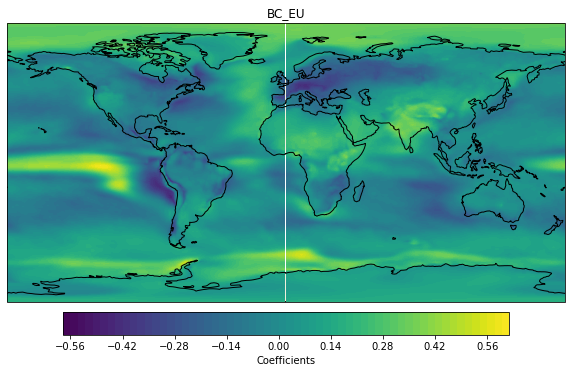

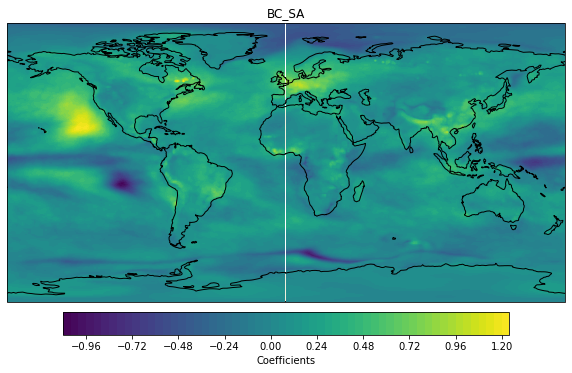

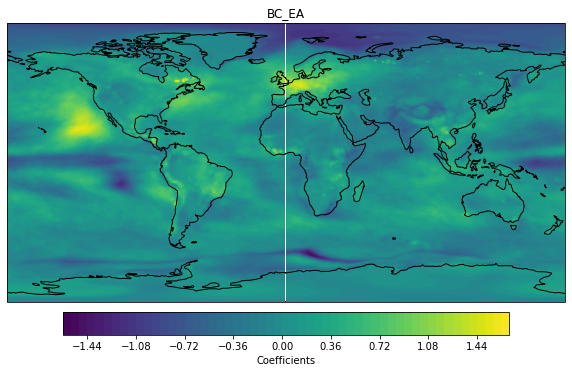

In [50]:
# Coefficients
rsds_coef = r6.coef_
rsds_coef1 = rsds_coef.reshape(192, 288, 10)

lat_vals = Y['lat']
lon_vals = Y['lon']
feature_names=['CO2', 'CH4', 'SO2_NA', 'SO2_EU', 'SO2_SA', 'SO2_EA', 'BC_NA', 'BC_EU', 'BC_SA', 'BC_EA']
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, rsds_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='Coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()
    

### `sfcWind`

In [51]:
# Linear
l7 = LinearRegression()
lr_wind = l7.fit(leading_historical_inputs, y_train_wind)

l_wind = lr_wind.predict(test_inputs)
l_out_wind = l_wind.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(wind_truth[35], l_out_wind[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(wind_truth[85], l_out_wind[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(wind_truth[30:41], l_out_wind[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(wind_truth[75:], l_out_wind[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(wind_truth[35:], l_out_wind[35:]).mean()}")

RMSE at 2050: 0.19215416493190696
RMSE at 2100: 0.26315953935055164
RMSE 2045-2055: 0.20684582701223314
RMSE 2090-2100: 0.2495005068503563
RMSE 2050-2100: 0.23032671917150402


In [93]:
# Ridge
r7 = Ridge(alpha = 10.0)
ridge_wind = r7.fit(leading_historical_inputs, y_train_wind)

r_wind = ridge_wind.predict(test_inputs)
r_out_wind = r_wind.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(wind_truth[35], r_out_wind[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(wind_truth[85], r_out_wind[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(wind_truth[30:41], r_out_wind[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(wind_truth[75:], r_out_wind[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(wind_truth[35:], r_out_wind[35:]).mean()}")

RMSE at 2050: 0.182441017131693
RMSE at 2100: 0.18976257339656397
RMSE 2045-2055: 0.1997422865084628
RMSE 2090-2100: 0.1961286674567009
RMSE 2050-2100: 0.20459852055662858


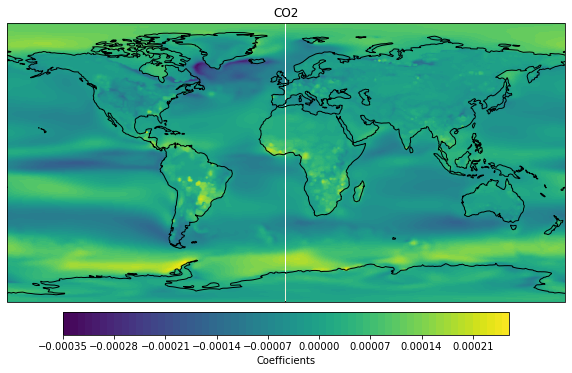

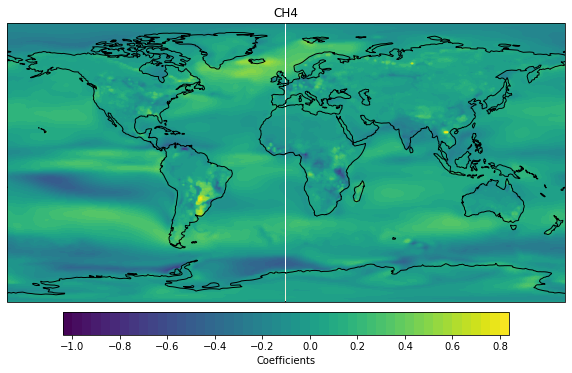

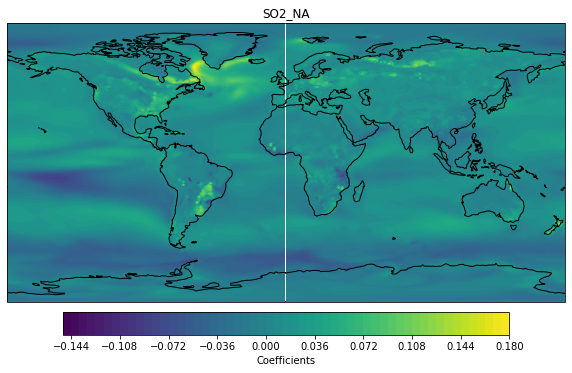

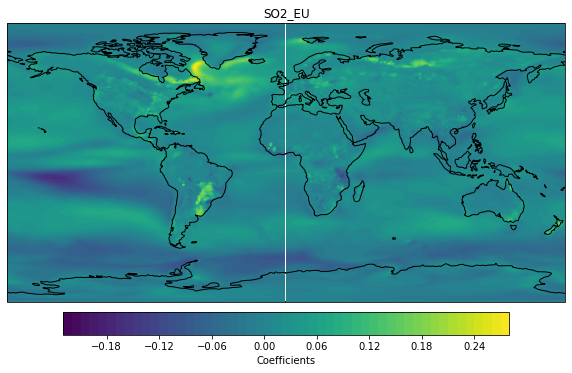

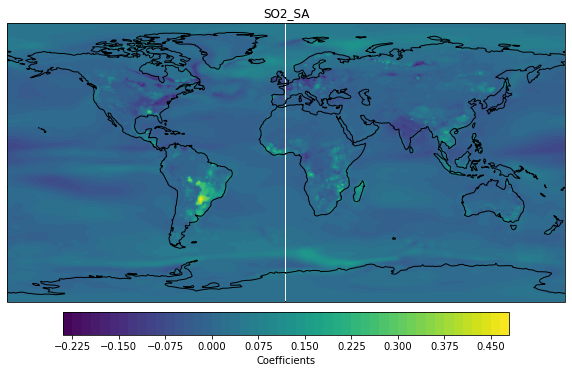

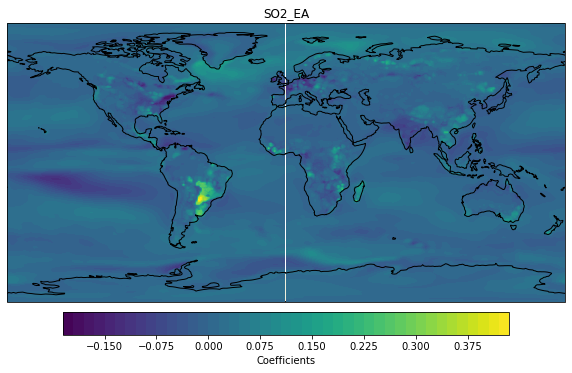

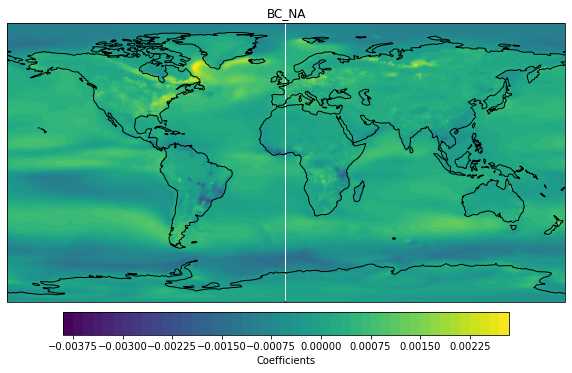

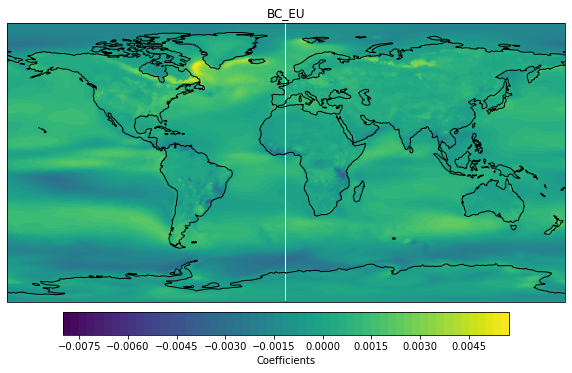

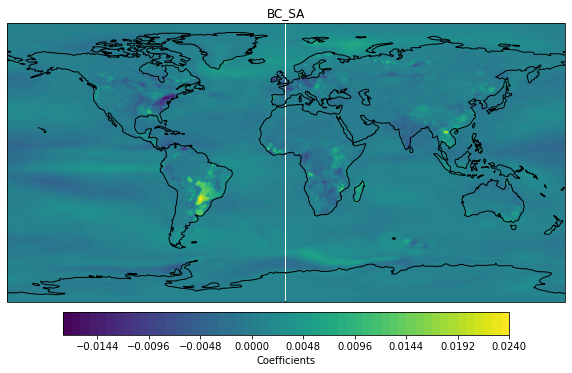

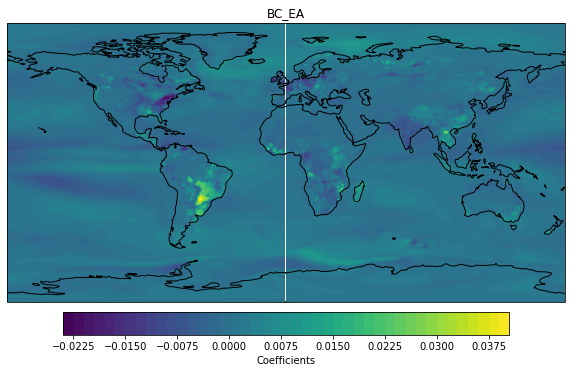

In [94]:
# Coefficients
wind_coef = r7.coef_
wind_coef1 = wind_coef.reshape(192, 288, 10)

lat_vals = Y['lat']
lon_vals = Y['lon']
feature_names=['CO2', 'CH4', 'SO2_NA', 'SO2_EU', 'SO2_SA', 'SO2_EA', 'BC_NA', 'BC_EU', 'BC_SA', 'BC_EA']
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, wind_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='Coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()
    

### `ps`

In [57]:
# Linear
l8 = LinearRegression()
lr_ps = l8.fit(leading_historical_inputs, y_train_ps)

l_ps = lr_ps.predict(test_inputs)
l_out_ps = l_ps.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(ps_truth[35], l_out_ps[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(ps_truth[85], l_out_ps[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(ps_truth[30:41], l_out_ps[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(ps_truth[75:], l_out_ps[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(ps_truth[35:], l_out_ps[35:]).mean()}")

RMSE at 2050: 65.48517856225989
RMSE at 2100: 118.22576020080274
RMSE 2045-2055: 73.89642075708355
RMSE 2090-2100: 98.4971714795791
RMSE 2050-2100: 86.82282805519111


In [95]:
# Ridge
r8 = Ridge(alpha = 8.0)
ridge_ps = r8.fit(leading_historical_inputs, y_train_ps)

r_ps = ridge_ps.predict(test_inputs)
r_out_ps = r_ps.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(ps_truth[35], r_out_ps[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(ps_truth[85], r_out_ps[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(ps_truth[30:41], r_out_ps[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(ps_truth[75:], r_out_ps[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(ps_truth[35:], r_out_ps[35:]).mean()}")

RMSE at 2050: 66.16188230124756
RMSE at 2100: 85.79075714635795
RMSE 2045-2055: 72.08230763311957
RMSE 2090-2100: 76.28317031138089
RMSE 2050-2100: 76.83852081712928


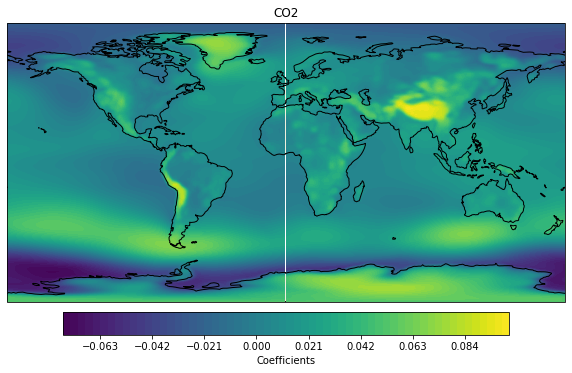

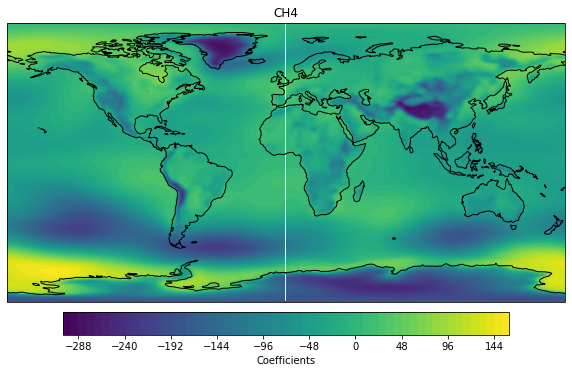

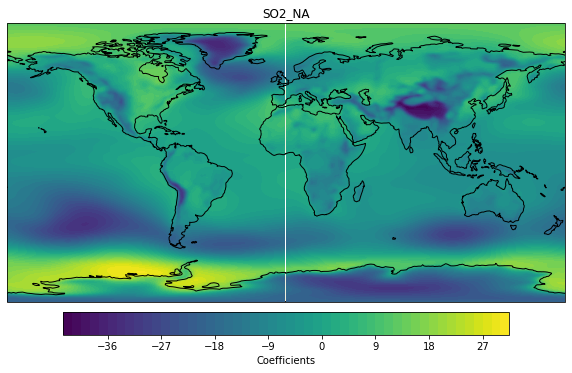

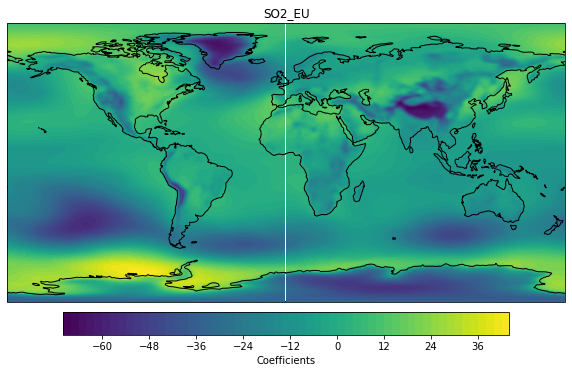

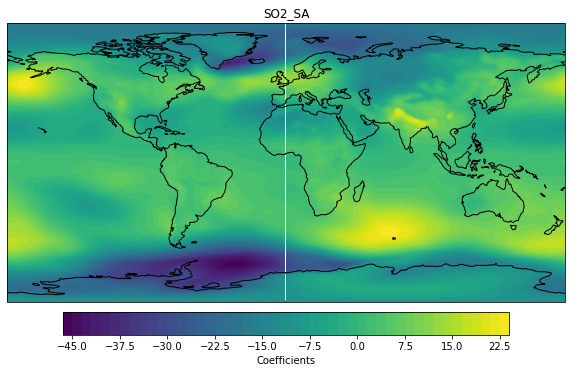

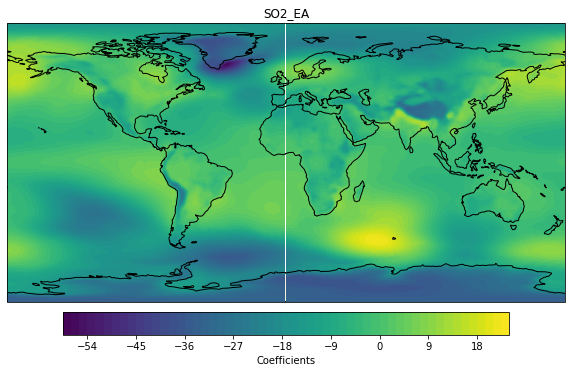

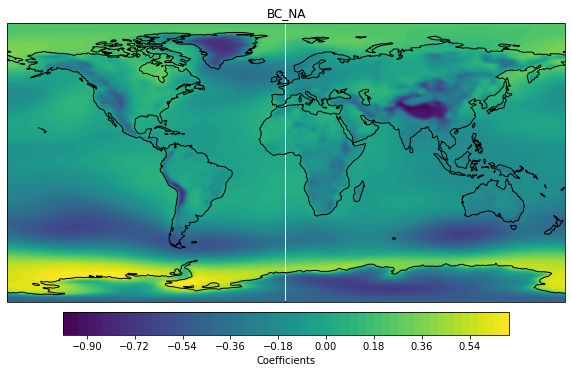

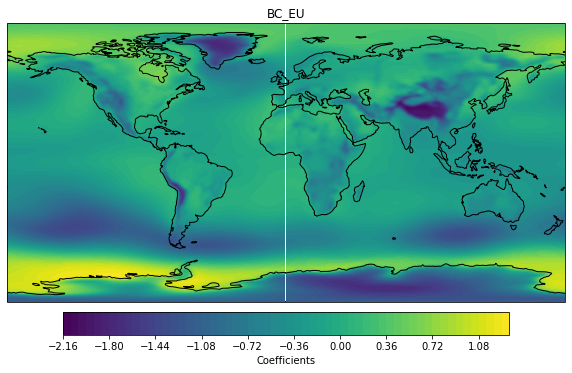

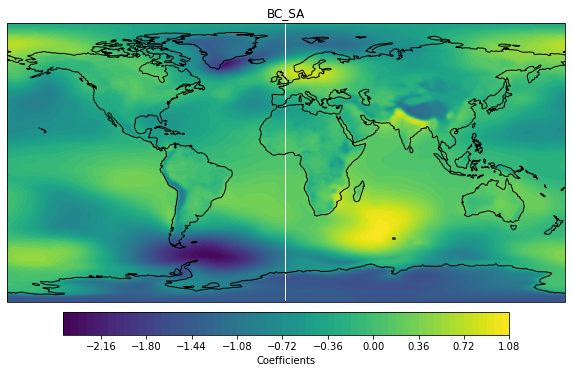

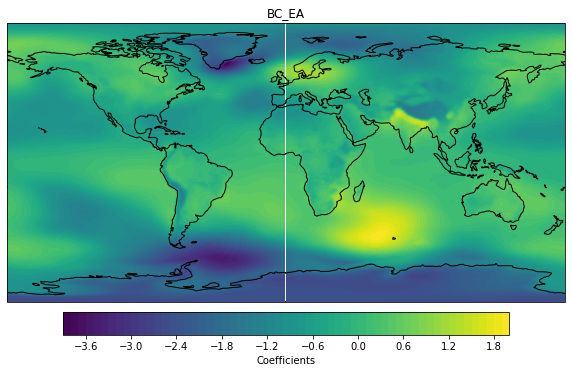

In [96]:
# Coefficients
ps_coef = r8.coef_
ps_coef1 = ps_coef.reshape(192, 288, 10)

lat_vals = Y['lat']
lon_vals = Y['lon']
feature_names=['CO2', 'CH4', 'SO2_NA', 'SO2_EU', 'SO2_SA', 'SO2_EA', 'BC_NA', 'BC_EU', 'BC_SA', 'BC_EA']
for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, ps_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='Coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()
    

In [75]:
# Linear
l9 = LinearRegression()
lr_mrsos = l9.fit(leading_historical_inputs, y_train_mrsos)

l_mrsos = lr_mrsos.predict(test_inputs)
l_out_mrsos = l_mrsos.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(mrsos_truth[35], l_out_mrsos[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(mrsos_truth[85], l_out_mrsos[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(mrsos_truth[30:41], l_out_mrsos[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(mrsos_truth[75:], l_out_mrsos[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(mrsos_truth[35:], l_out_mrsos[35:]).mean()}")

RMSE at 2050: 1.7048295836250567
RMSE at 2100: 2.3595099063967417
RMSE 2045-2055: 1.9524225028068953
RMSE 2090-2100: 2.251361958710762
RMSE 2050-2100: 2.062114183388726


In [97]:
# Ridge
r9 = Ridge(alpha = 0.1)
ridge_mrsos = r9.fit(leading_historical_inputs, y_train_mrsos)

r_mrsos = ridge_mrsos.predict(test_inputs)
r_out_mrsos = r_mrsos.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(mrsos_truth[35], r_out_mrsos[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(mrsos_truth[85], r_out_mrsos[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(mrsos_truth[30:41], r_out_mrsos[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(mrsos_truth[75:], r_out_mrsos[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(mrsos_truth[35:], r_out_mrsos[35:]).mean()}")

RMSE at 2050: 1.75607245589535
RMSE at 2100: 2.09349469459786
RMSE 2045-2055: 1.8084872372628837
RMSE 2090-2100: 2.040217488100201
RMSE 2050-2100: 1.9574897281959054


In [88]:
# Linear
l10 = LinearRegression()
lr_evspsbl = l10.fit(leading_historical_inputs, y_train_evspsbl)

l_evspsbl = lr_evspsbl.predict(test_inputs)
l_out_evspsbl = l_evspsbl.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(evspsbl_truth[35], l_out_evspsbl[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(evspsbl_truth[85], l_out_evspsbl[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(evspsbl_truth[30:41], l_out_evspsbl[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(evspsbl_truth[75:], l_out_evspsbl[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(evspsbl_truth[35:], l_out_evspsbl[35:]).mean()}")

RMSE at 2050: 1.3190463516359215e-06
RMSE at 2100: 1.6495806032841972e-06
RMSE 2045-2055: 1.5217437941459612e-06
RMSE 2090-2100: 1.7021596639848241e-06
RMSE 2050-2100: 1.6483378461569512e-06


In [86]:
# Ridge
r10 = Ridge(alpha = 0.1)
ridge_evspsbl = r10.fit(leading_historical_inputs, y_train_evspsbl)

r_evspsbl = ridge_evspsbl.predict(test_inputs)
r_out_evspsbl = r_evspsbl.reshape(86, 192, 288)

print(f"RMSE at 2050: {get_rmse(evspsbl_truth[35], r_out_evspsbl[35]).mean()}")
print(f"RMSE at 2100: {get_rmse(evspsbl_truth[85], r_out_evspsbl[85]).mean()}")
print(f"RMSE 2045-2055: {get_rmse(evspsbl_truth[30:41], r_out_evspsbl[30:41]).mean()}")
print(f"RMSE 2090-2100: {get_rmse(evspsbl_truth[75:], r_out_evspsbl[75:]).mean()}")
print(f"RMSE 2050-2100: {get_rmse(evspsbl_truth[35:], r_out_evspsbl[35:]).mean()}")

RMSE at 2050: 1.277394170405683e-06
RMSE at 2100: 1.5730771190776385e-06
RMSE 2045-2055: 1.4546933080170536e-06
RMSE 2090-2100: 1.6182424309377171e-06
RMSE 2050-2100: 1.6014741335437258e-06


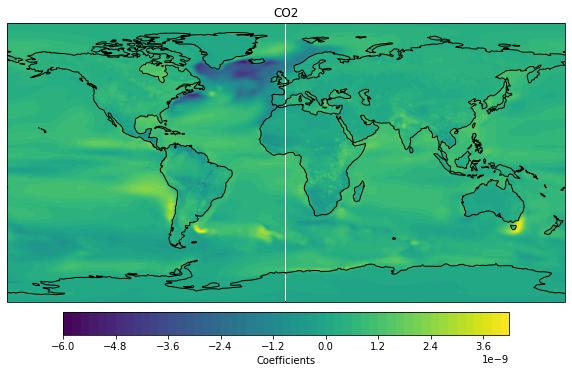

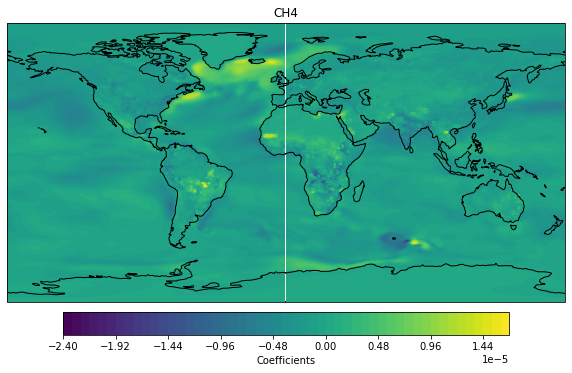

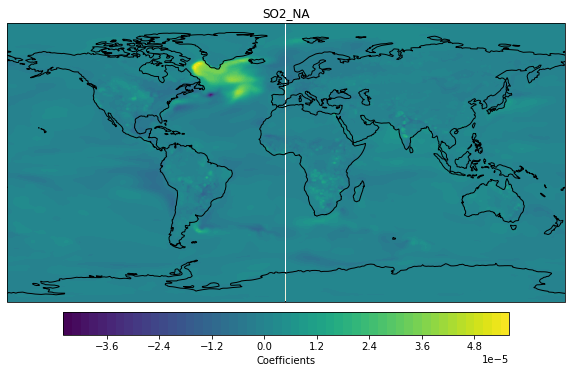

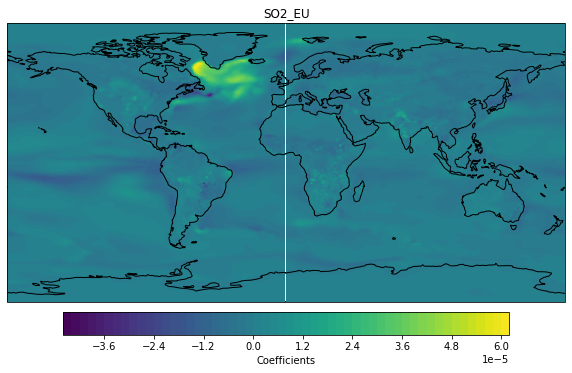

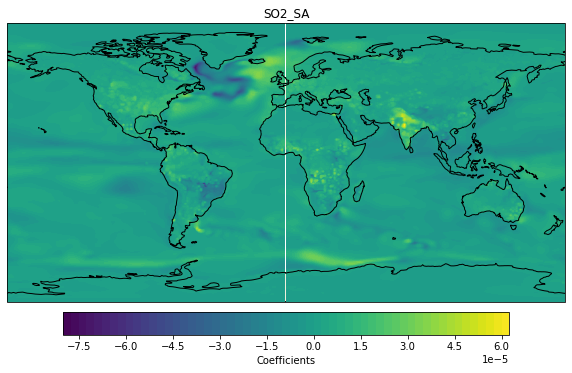

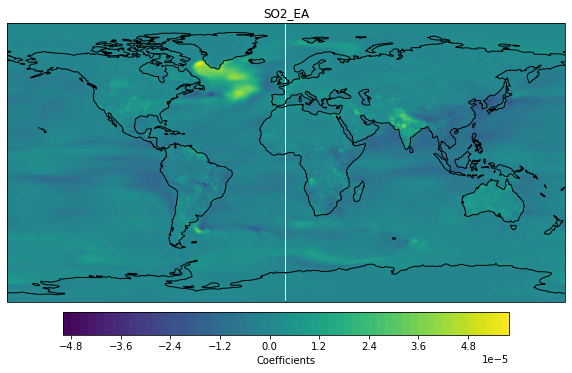

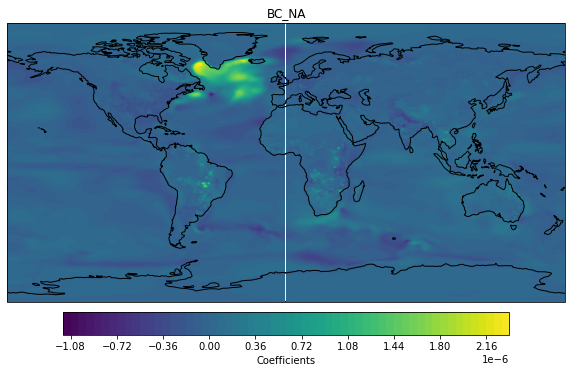

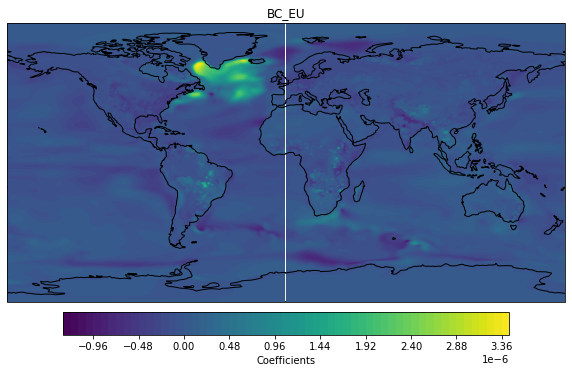

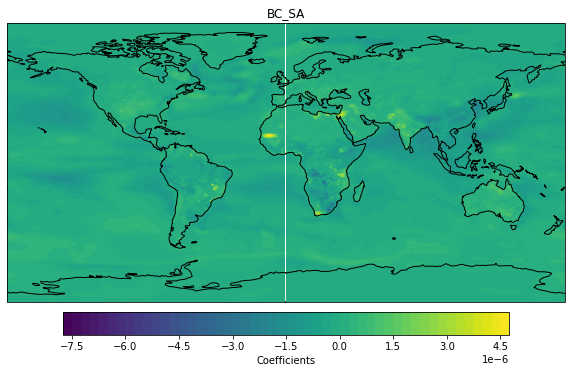

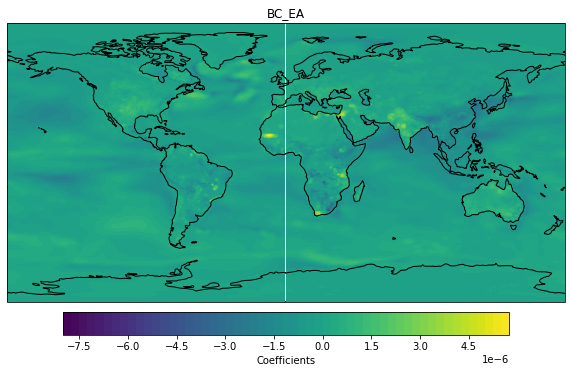

In [87]:
# Coefficients
evspsbl_coef = r10.coef_
evspsbl_coef1 = evspsbl_coef.reshape(192, 288, 10)

for i in range(len(feature_names)):
    
    plt.figure(figsize=(10, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE)
    # ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, edgecolor='black')

    plt.contourf(lon_vals, lat_vals, evspsbl_coef1[:,:,i], 60)

    cbar = plt.colorbar(ax=ax, label='Coefficients', orientation='horizontal', shrink=0.8, pad=0.02)

    plt.title(f"{feature_names[i]}")
    plt.show()

In [98]:
# Shorter
lr1 = LinearRegression()
lr2 = LinearRegression()
lr3 = LinearRegression()
lr4 = LinearRegression()
lr5 = LinearRegression()
lr6 = LinearRegression()
lr7 = LinearRegression()
lr8 = LinearRegression()
lr9 = LinearRegression()
lr10 = LinearRegression()

var_names = ['tas', 'pr', 'huss', 'hurs', 'rlds', 'rsds', 'sfcWind', 'ps', 'mrsos', 'evspsbl']
initialized_lr = [lr1, lr2, lr3, lr4, lr5, lr6, lr7, lr8, lr9, lr10]
train_vars = [y_train_tas, y_train_pr, y_train_huss, y_train_hurs, y_train_rlds, y_train_rsds, y_train_wind, y_train_ps, y_train_mrsos, y_train_evspsbl]
truth_vars = [tas_truth, pr_truth, huss_truth, hurs_truth, rlds_truth, rsds_truth, wind_truth, ps_truth, mrsos_truth, evspsbl_truth]

for i in range(len(initialized_lr)):
    lr_fit = initialized_lr[i].fit(leading_historical_inputs, train_vars[i])
    l_var = lr_fit.predict(test_inputs)
    l_out_var = l_var.reshape(86, 192, 288)
    
    print(f"{var_names[i]} rmse values")
    print(f"RMSE at 2050: {get_rmse(truth_vars[i][35], l_out_var[35]).mean()}")
    print(f"RMSE at 2100: {get_rmse(truth_vars[i][85], l_out_var[85]).mean()}")
    print(f"RMSE 2045-2055: {get_rmse(truth_vars[i][30:41], l_out_var[30:41]).mean()}")
    print(f"RMSE 2090-2100: {get_rmse(truth_vars[i][75:], l_out_var[75:]).mean()}")
    print(f"RMSE 2050-2100: {get_rmse(truth_vars[i][35:], l_out_var[35:]).mean()}\n")


tas rmse values
RMSE at 2050: 0.37594529660206943
RMSE at 2100: 1.4340286457346347
RMSE 2045-2055: 0.4338746909111567
RMSE 2090-2100: 1.4132045566694782
RMSE 2050-2100: 1.0823888249323068

pr rmse values
RMSE at 2050: 0.41616017795686333
RMSE at 2100: 0.5413143243952228
RMSE 2045-2055: 0.5277878504516005
RMSE 2090-2100: 0.5962594862951042
RMSE 2050-2100: 0.5862612113898605

huss rmse values
RMSE at 2050: 0.0002359056371666356
RMSE at 2100: 0.0009955989569544472
RMSE 2045-2055: 0.00027050710335773835
RMSE 2090-2100: 0.000992155758269653
RMSE 2050-2100: 0.0007289617356857337

hurs rmse values
RMSE at 2050: 0.9124976433912165
RMSE at 2100: 1.4658228719833795
RMSE 2045-2055: 1.0122974007666519
RMSE 2090-2100: 1.4677130893788044
RMSE 2050-2100: 1.250724168426771

rlds rmse values
RMSE at 2050: 2.176356294445007
RMSE at 2100: 10.952251147785114
RMSE 2045-2055: 2.6449516183553134
RMSE 2090-2100: 10.8387894150671
RMSE 2050-2100: 7.752227254039499

rsds rmse values
RMSE at 2050: 4.3937491740124

In [ ]:
# ridge loop
alpha_vals = [0.001, 0.005, 0.01, 0.05, 0.1, 0.3, 0.5, 0.8, 1.0, 3.0, 5.0, 8.0, 10]
for i in range(len(initialized_lr)):
    rmse_mean_vals = []
    for j in range(len(alpha_vals)):
        initial_ridge = Ridge(alpha_vals[j])
        ridge_var = initial_ridge.fit(leading_historical_inputs, train_vars[i])
        
        r_var = ridge_var.predict(test_inputs)
        r_out_var = r_var.reshape(86, 192, 288)
        
        rmse1 = get_rmse(truth_vars[i][35], r_out_var[35]).mean()
        rmse2 = get_rmse(truth_vars[i][85], r_out_var[85]).mean()
        rmse3 = get_rmse(truth_vars[i][30:41], r_out_var[30:41]).mean()
        rmse4 = get_rmse(truth_vars[i][75:], r_out_var[75:]).mean()
        rmse5 = get_rmse(truth_vars[i][35:], r_out_var[35:]).mean()
        
        rmse_list = [rmse1, rmse2, rmse3, rmse4, rmse5]
        mean_rmse = sum(rmse_list) / len(rmse_list)
        rmse_mean_vals.append(mean_rmse)
            
    min_val = min(rmse_mean_vals)
    min_idx = rmse_mean_vals.index(min_val)
    
    ridge_with_alpha = Ridge(alpha_vals[min_idx])
    ridge = ridge_with_alpha.fit(leading_historical_inputs, train_vars[i])
    
    r_vars = ridge.predict(test_inputs)
    r_out_vars = r_vars.reshape(86, 192, 288)
    
    print(f"{var_names[i]} rmse values, where alpha={alpha_vals[min_idx]}")
    print(f"RMSE at 2050: {get_rmse(truth_vars[i][35], r_out_vars[35]).mean()}")
    print(f"RMSE at 2100: {get_rmse(truth_vars[i][85], r_out_vars[85]).mean()}")
    print(f"RMSE 2045-2055: {get_rmse(truth_vars[i][30:41], r_out_vars[30:41]).mean()}")
    print(f"RMSE 2090-2100: {get_rmse(truth_vars[i][75:], r_out_vars[75:]).mean()}")
    print(f"RMSE 2050-2100: {get_rmse(truth_vars[i][35:], r_out_vars[35:]).mean()}\n")
